# Машинное обучение, ФКН ВШЭ

## Практическое задание 3. Градиентный спуск своими руками

### Общая информация
Дата выдачи: **01.11.2024**

Мягкий дедлайн: **13.11.24 23:59**

Жесткий дедлайн: **15.11.24 23:59**

### О задании

В данном задании необходимо реализовать обучение линейной регрессии с помощью различных вариантов градиентного спуска.


### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов + 2 балла бонус.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.
Также оценка может быть снижена за плохо читаемый код и плохо считываемые диаграммы.

Все ответы должны сопровождаться кодом или комментариями о том, как они были получены.


### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-03-gd-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

**Оценка**: 11

Напомним, что на лекциях и семинарах мы разбирали некоторые подходы к оптимизации функционалов по параметрам. В частности, был рассмотрен градиентный спуск и различные подходы к его реализации — полный градиентный спуск, стохастический градиентный спуск, метод импульса и другие. В качестве модели у нас будет выступать линейная регрессия.

В этом домашнем задании вам предстоит реализовать 4 различных вариации градиентного спуска, написать свою реализацию линейной регресии, сравнить методы градиентного спуска между собой на реальных данных и ещё много чего веселого и интересного!

## Задание 1. Реализация градиентного спуска (3.5 балла)

В этом задании вам предстоит написать собственные реализации различных подходов к градиентному спуску с опорой на подготовленные шаблоны в файле `descents.py`.

**Все реализуемые методы должны быть векторизованы!**

### Лирическое-теоретическое отступление № 1

Основное свойство антиградиента &ndash; он указывает в сторону наискорейшего убывания функции в данной точке. Соответственно, будет логично стартовать из некоторой точки, сдвинуться в сторону антиградиента,
пересчитать антиградиент и снова сдвинуться в его сторону и т.д. Запишем это более формально.

Пусть $w_0$ &ndash; начальный набор параметров (например, нулевой или сгенерированный из некоторого
случайного распределения). Тогда ванильный градиентный спуск состоит в повторении следующих шагов до сходимости:

$$
    w_{k + 1} = w_{k} - \eta_{k} \nabla_{w} Q(w_{k}).
$$

### Лирическое-теоретическое отступление № 2

На семинаре про [матрично-векторное дифференцирование](https://github.com/esokolov/ml-course-hse/blob/master/2022-fall/seminars/sem03-vector-diff.pdf) вы должны были обсуждать дифференцирование функции потерь MSE в матричном виде.

### Задание 1.0. Градиент MSE в матричном виде (0.02 балла).

Напомним, что функция потерь MSE записывается в матричном виде как:

$$
    Q(w) = \dfrac{1}{\ell} \left( y - Xw \right)^T \left( y - Xw \right)
$$

Выпишите ниже (подсмотрев в семинар или решив самостоятельно) градиент для функции потерь MSE в матричном виде.

$$
- \dfrac{2}{\ell}X^T(y - Xw) 
$$

### Задание 1.1. Родительский класс BaseDescent (0.5 балла).

Реализуйте функции `calc_loss` (вычисление MSE для переданных $x$ и $y$) и `predict` (предсказание $y_{pred}$ для переданных $x$) в классе `BaseDescent`.

Все вычисления должны быть векторизованы.

### Задание 1.2. Полный градиентный спуск VanillaGradientDescent (0.5 балла).

Реализуйте полный градиентный спуск заполнив пропуски в классе `VanillaGradientDescent` в файле `descents.py`. Для вычисления градиента используйте формулу выше. Шаг оптимизации:

$$
    w_{k + 1} = w_{k} - \eta_{k} \nabla_{w} Q(w_{k}).
$$

Здесь и далее функция `update_weights` должна возвращать разницу между $w_{k + 1}$ и $w_{k}$: $\quad w_{k + 1} - w_{k} = -\eta_{k} \nabla_{w} Q(w_{k})$. Кроме того, соответственно своему названию, она должна обновлять веса. 

Во всех методах градиентного спуска мы будем использовать следующую формулу для длины шага:

$$
    \eta_{k} = \lambda \left(\dfrac{s_0}{s_0 + k}\right)^p
$$

На практике достаточно настроить параметр $\lambda$, а остальным выставить параметры по умолчанию: $s_0 = 1, \, p = 0.5.$

### Лирическое-теоретическое отступление № 3

Как правило, в задачах машинного обучения функционал $Q(w)$ представим в виде суммы $\ell$ функций:

$$
    Q(w)
    =
    \frac{1}{\ell}
    \sum_{i = 1}^{\ell}
        q_i(w).
$$

В нашем домашнем задании отдельные функции $q_i(w)$ соответствуют ошибкам на отдельных объектах.

Проблема метода градиентного спуска состоит в том, что на каждом шаге необходимо вычислять градиент всей суммы (будем его называть полным градиентом):

$$
    \nabla_w Q(w)
    =
    \frac{1}{\ell}
    \sum_{i = 1}^{\ell}
        \nabla_w q_i(w).
$$

Это может быть очень трудоёмко при больших размерах выборки. В то же время точное вычисление градиента может быть не так уж необходимо &ndash; как правило, мы делаем не очень большие шаги в сторону антиградиента, и наличие в нём неточностей не должно сильно сказаться на общей траектории.

Оценить градиент суммы функций можно средним градиентов случайно взятого подмножества функций:

$$
    \nabla_{w} Q(w_{k}) \approx \dfrac{1}{|B|}\sum\limits_{i \in B}\nabla_{w} q_{i}(w_{k}),
$$
где $B$ - это случайно выбранное подмножество индексов.

В этом случае мы получим метод **стохастического градиентного спуска**.

### Задание 1.3. Стохастический градиентный спуск StochasticDescent (0.5 балла).

Реализуйте стохастический градиентный спуск заполнив пропуски в классе `StochasticDescent`. Для оценки градиента используйте формулу выше (среднее градиентов случайно выбранного батча объектов). Шаг оптимизации:

$$
    w_{k + 1} = w_{k} - \eta_{k} \dfrac{1}{|B|}\sum\limits_{i \in B}\nabla_{w} q_{i}(w_{k}).
$$

Размер батча будет являться гиперпараметром метода, семплируйте индексы для батча объектов с помощью `np.random.randint`.

### Лирическое-теоретическое отступление № 4

Может оказаться, что направление антиградиента сильно меняется от шага к шагу. Например, если линии уровня функционала сильно вытянуты, то из-за ортогональности градиента линиям уровня он будет менять направление на почти противоположное на каждом шаге. Такие осцилляции будут вносить сильный шум в движение, и процесс оптимизации займёт много итераций. Чтобы избежать этого, можно усреднять векторы антиградиента с нескольких предыдущих шагов &ndash; в этом случае шум уменьшится, и такой средний вектор будет указывать в сторону общего направления движения. Введём для этого вектор инерции:

\begin{align}
    &h_0 = 0, \\
    &h_{k + 1} = \alpha h_{k} + \eta_k \nabla_w Q(w_{k})
\end{align}

Здесь $\alpha$ &ndash; параметр метода, определяющей скорость затухания градиентов с предыдущих шагов. Разумеется, вместо вектора градиента может быть использована его аппроксимация. Чтобы сделать шаг градиентного спуска, просто сдвинем предыдущую точку на вектор инерции:

$$
    w_{k + 1} = w_{k} - h_{k + 1}.
$$

Заметим, что если по какой-то координате градиент постоянно меняет знак, то в результате усреднения градиентов в векторе инерции эта координата окажется близкой к нулю. Если же по координате знак градиента всегда одинаковый, то величина соответствующей координаты в векторе инерции будет большой, и мы будем делать большие шаги в соответствующем направлении.

### Задание 1.4 Метод Momentum MomentumDescent (0.5 балла).

Реализуйте градиентный спуск с методом инерции заполнив пропуски в классе `MomentumDescent`. Шаг оптимизации:

\begin{align}
    &h_0 = 0, \\
    &h_{k + 1} = \alpha h_{k} + \eta_k \nabla_w Q(w_{k}) \\
    &w_{k + 1} = w_{k} - h_{k + 1}.
\end{align}

$\alpha$ будет являться гиперпараметром метода, но в данном домашнем задании мы зафиксируем её за вас $\alpha = 0.9$.

### Лирическое-теоретическое отступление № 5

Градиентный спуск очень чувствителен к выбору длины шага. Если шаг большой, то есть риск, что мы будем перескакивать через точку минимума; если же шаг маленький, то для нахождения минимума потребуется много итераций. При этом нет способов заранее определить правильный размер шага &ndash; к тому же, схемы с постепенным уменьшением шага по мере итераций могут тоже плохо работать.

В методе AdaGrad предлагается сделать свою длину шага для каждой компоненты вектора параметров. При этом шаг будет тем меньше, чем более длинные шаги мы делали на предыдущих итерациях:

\begin{align}
    &G_{kj} = G_{k-1,j} + (\nabla_w Q(w_{k - 1}))_j^2; \\
    &w_{jk} = w_{j,k-1} - \frac{\eta_t}{\sqrt{G_{kj}} + \varepsilon} (\nabla_w Q(w_{k - 1}))_j.
\end{align}

Здесь $\varepsilon$ небольшая константа, которая предотвращает деление на ноль.

В данном методе можно зафксировать длину шага (например, $\eta_k = 0.01$) и не подбирать её в процессе обучения **(обратите внимание, что в данном домашнем задании длина шага не фиксируется)**. Отметим, что данный метод подходит для разреженных задач, в которых у каждого объекта большинство признаков равны нулю. Для признаков, у которых ненулевые значения встречаются редко, будут делаться большие шаги; если же какой-то признак часто является ненулевым, то шаги по нему будут небольшими.

У метода AdaGrad есть большой недостаток: переменная $G_{kj}$ монотонно растёт, из-за чего шаги становятся всё медленнее и могут остановиться ещё до того, как достигнут минимум функционала. Проблема решается в методе RMSprop, где используется экспоненциальное затухание градиентов:

$$
    G_{kj} = \alpha G_{k-1,j} + (1 - \alpha) (\nabla_w Q(w^{(k-1)}))_j^2.
$$

В этом случае размер шага по координате зависит в основном от того, насколько
быстро мы двигались по ней на последних итерациях.

Можно объединить идеи описанных выше методов: накапливать градиенты со всех прошлых шагов для
избежания осцилляций и делать адаптивную длину шага по каждому параметру.

### Задание 1.5. Метод Adam (Adaptive Moment Estimation) (1.5 балла).

Реализуйте градиентный спуск с методом Adam заполнив пропуски в классе `Adam`. Шаг оптимизации:

\begin{align}
    &m_0 = 0, \quad v_0 = 0; \\ \\
    &m_{k + 1} = \beta_1 m_k + (1 - \beta_1) \nabla_w Q(w_{k}); \\ \\
    &v_{k + 1} = \beta_2 v_k + (1 - \beta_2) \left(\nabla_w Q(w_{k})\right)^2; \\ \\
    &\widehat{m}_{k} = \dfrac{m_k}{1 - \beta_1^{k}}, \quad \widehat{v}_{k} = \dfrac{v_k}{1 - \beta_2^{k}}; \\ \\
    &w_{k + 1} = w_{k} - \dfrac{\eta_k}{\sqrt{\widehat{v}_{k + 1}} + \varepsilon} \widehat{m}_{k + 1}.
\end{align}

$\beta_1 = 0.9, \beta_2 = 0.999$ и $\varepsilon = 10^{-8}$ будут зафиксированы за вас.

## Задание 2. Реализация линейной регресии (0.5 балла)

В этом задании вам предстоит написать свою реализацию линейной регресии, обучаемой с использованием градиентного спуска, с опорой на подготовленные шаблоны в файле `linear_regression.py` - **LinearRegression**. По сути линейная регрессия будет оберткой, которая запускает обучение 

Необходимо соблюдать следующие условия:

* Все вычисления должны быть векторизованы;
* Циклы средствами python допускаются только для итераций градиентного спуска;
* В качестве критерия останова необходимо использовать (одновременно):
    * Квадрат евклидовой нормы разности весов на двух соседних итерациях меньше `tolerance`;
    * Разность весов содержит наны;
    * Достижение максимального числа итераций `max_iter`.
* Будем считать, что все данные, которые поступают на вход имеют столбец единичек последним столбцом;
* Веса модели надо обновлять внутри функции `update_weights`, она неспроста так называется
* Чтобы проследить за сходимостью оптимизационного процесса будем использовать `loss_history`, в нём будем хранить значения функции потерь до каждого шага, начиная с нулевого (до первого шага по антиградиенту) и значение функции потерь после оптимизации.

## Задание 3. Проверка кода (0 баллов)

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

import numpy as np

from descents import get_descent
from linear_regression import LinearRegression

In [3]:
num_objects = 100
dimension = 5

x = np.random.rand(num_objects, dimension)
y = np.random.rand(num_objects)

In [4]:
# Descents

descent_config = {
    'descent_name': 'some name that we will replace in the future',
    'kwargs': {
        'dimension': dimension
    }
}

for descent_name in ['full', 'stochastic', 'momentum', 'adam']:
    descent_config['descent_name'] = descent_name
    descent = get_descent(descent_config)

    diff = descent.step(x, y)
    gradient = descent.calc_gradient(x, y)
    predictions = descent.predict(x)

    assert gradient.shape[0] == dimension, f'Gradient failed for descent {descent_name}'
    assert diff.shape[0] == dimension, f'Weights failed for descent {descent_name}'
    assert predictions.shape == y.shape, f'Prediction failed for descent {descent_name}'

In [5]:
# LinearRegression

max_iter = 10
tolerance = 0

descent_config = {
    'descent_name': 'stochastic',
    'kwargs': {
        'dimension': dimension,
        'batch_size': 10
    }
}

regression = LinearRegression(
    descent_config=descent_config,
    tolerance=tolerance,
    max_iter=max_iter
)

regression.fit(x, y)

assert len(regression.loss_history) == max_iter + 1, 'Loss history failed'

Если ваше решение прошло все тесты локально, то теперь пришло время протестировать его в [Яндекс Контесте](https://contest.yandex.ru/contest/54610/).

**salnikovignat**

Для каждой задачи из контеста вставьте ссылку на успешную посылку:

* **VanillaGradientDescent**:

https://contest.yandex.ru/contest/70588/run-report/124798367/


* **StochasticDescent**:

https://contest.yandex.ru/contest/70588/run-report/124700527/


* **MomentumDescent**:

https://contest.yandex.ru/contest/70588/run-report/124700941/


* **Adam**:

https://contest.yandex.ru/contest/70588/run-report/124718322/

* **LinearRegression**:

https://contest.yandex.ru/contest/70588/run-report/124798392/

## Задание 4. Работа с данными (1 балл)

Мы будем использовать датасет объявлений по продаже машин на немецком Ebay. В задаче предсказания целевой переменной для нас будет являться цена.

* Постройте график распределения целевой переменной в данных, подумайте, нужно ли заменить её на логарифм. Присутствуют ли выбросы в данных с аномальной ценой? Если да, то удалите их из данных.

* Проведите исследование данных:
    * Проанализируйте тип столбцов, постройте графики зависимости целевой переменной от признака, распределения значений признака;
    * Подумайте (и напишите): какие признаки могут быть полезными на основе этих графиков, обработайте выбросы;
    * Подумайте (и напишите): какие трансформации признаков из известных вам будет уместно применить;
    * Разделите полезные признаки на категориальные, вещественные и те, которые не надо предобрабатывать.
* Разделите данные на обучающую, валидационную и тестовую выборки в отношении 8:1:1.

**Ответ:**

Все признаки полезные. Из трансформаций только два раза логарифм понадобился, или вопрос про onehot и StandardScaler, да их тоже нужно. В категоральных мы объединим очень редкие категории, а в числовых сделаем клипы или выбросим из датасета экстримальные значения. 

**Замечание:**

Сразу посмотрим на распределение на фичах и сделаем клипы, тут не страшно в тест заглядывать так как мы не выбрасываем данные, не потим метрики и все преобразования все равно делаются исходя из здравого смысла а не распределений.

In [6]:
import numpy as np
import pandas as pd  # при желании, можете заменить на polars/pyspark или что угодно, что вам нравится

import matplotlib.pyplot as plt
import seaborn as sns

from descents import get_descent
from linear_regression import LinearRegression

sns.set(style='darkgrid')

In [7]:
data = pd.read_csv('autos.csv')  # разумеется, если вы используете не pandas, это надо поменять

In [8]:
data.head()

,brand,model,vehicleType,gearbox,fuelType,notRepairedDamage,powerPS,kilometer,autoAgeMonths,price
0,volkswagen,golf,kleinwagen,manuell,benzin,nein,75,150000,177,1500
1,skoda,fabia,kleinwagen,manuell,diesel,nein,69,90000,93,3600
2,bmw,3er,limousine,manuell,benzin,ja,102,150000,246,650
3,peugeot,2_reihe,cabrio,manuell,benzin,nein,109,150000,140,2200
4,mazda,3_reihe,limousine,manuell,benzin,nein,105,150000,136,2000


Колонки в данных:

* `brand` - название бренда автомобиля
* `model` - название модели автомобиля
* `vehicleType` - тип транспортного средства
* `gearbox` - тип трансмисcии
* `fuelType` - какой вид топлива использует автомобиль
* `notRepairedDamage` - есть ли в автомобиле неисправность, которая еще не устранена
* `powerPS` - мощность автомобиля в PS (метрическая лошадиная сила)
* `kilometer` - сколько километров проехал автомобиль, пробег
* `autoAgeMonths` - возраст автомобиля в месяцах


* `price` - цена, указанная в объявлении о продаже автомобиля (целевая переменная)

In [9]:
categorical = ['brand', 'model', 'vehicleType', 'gearbox', 'fuelType', 'notRepairedDamage']
numeric = ['powerPS', 'kilometer', 'autoAgeMonths']
other = []

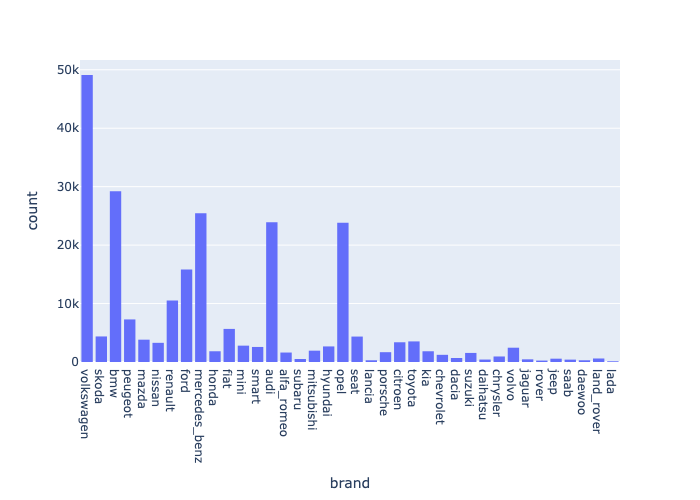

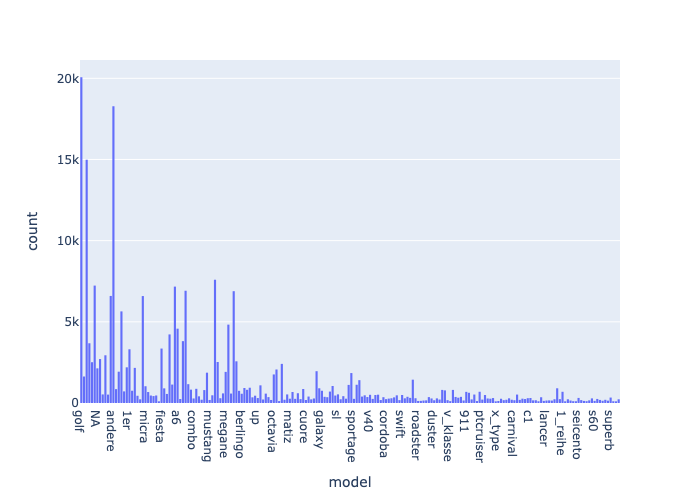

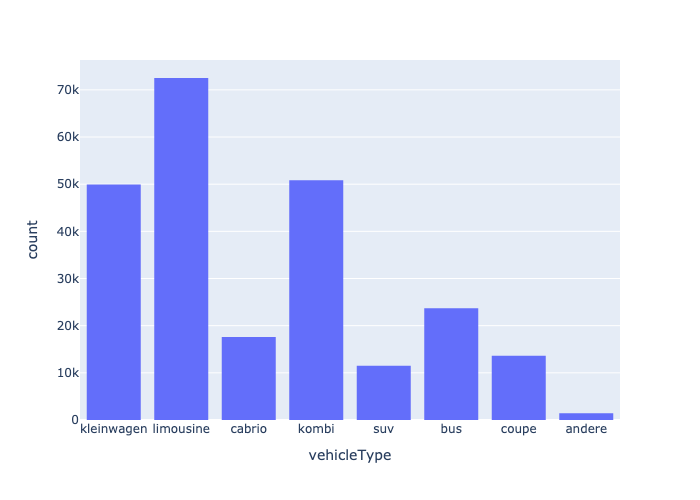

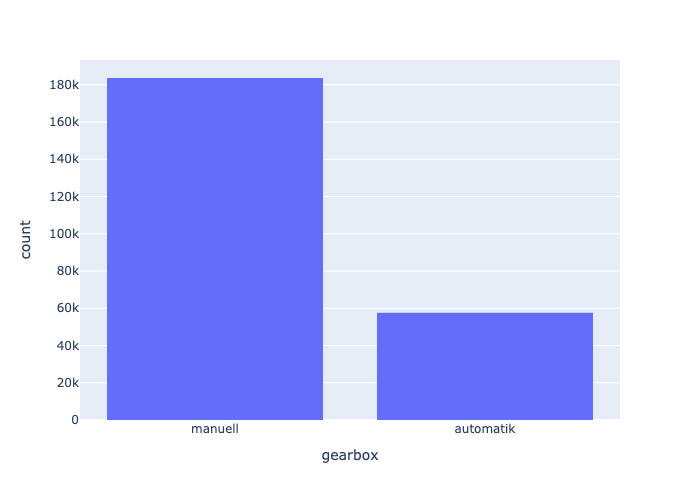

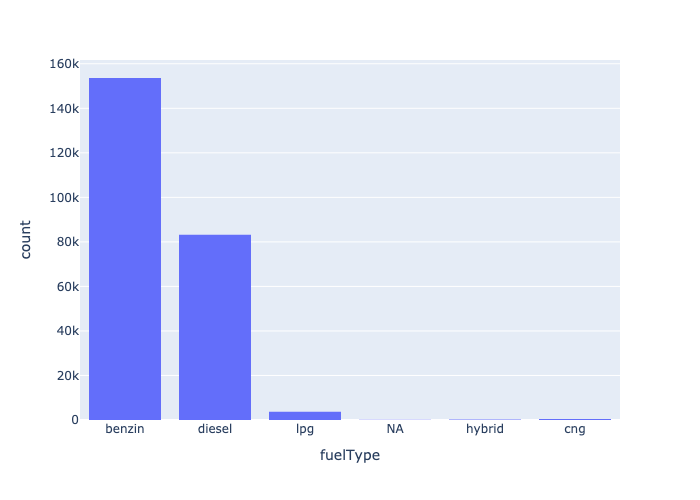

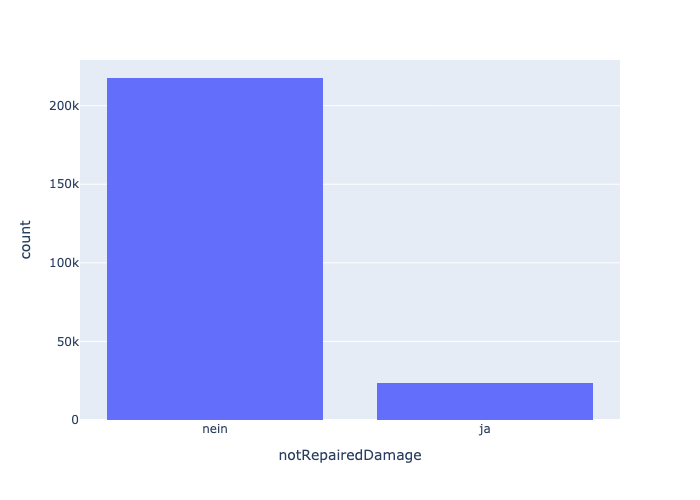

In [10]:
import plotly.express as px

threshold = 100

for column in categorical:
    
    # объединяем редкие категории
    value_counts = data[column].value_counts()
    rare_categories = value_counts[value_counts < threshold].index

    data[column] = data[column].apply(lambda x: 'NA' if x in rare_categories else x)
    
    px.histogram(data, column).show(renderer='png')

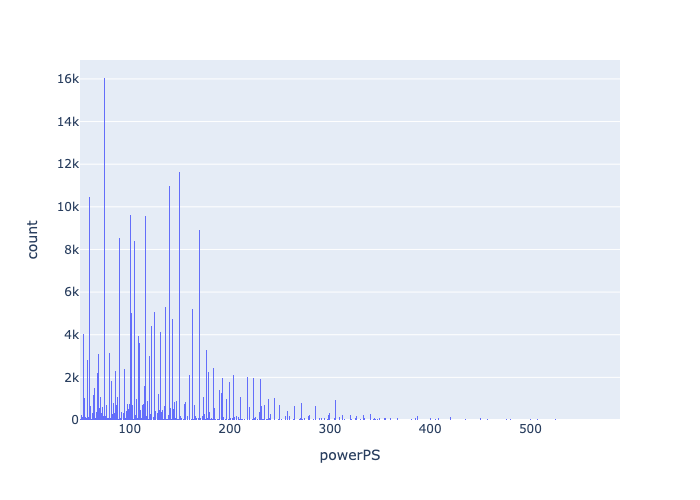

In [11]:
px.histogram(data, 'powerPS').show(renderer='png') # логарифмируем и клипуем 

In [12]:
data['powerPS'] = np.log(data['powerPS'].clip(50, 500))

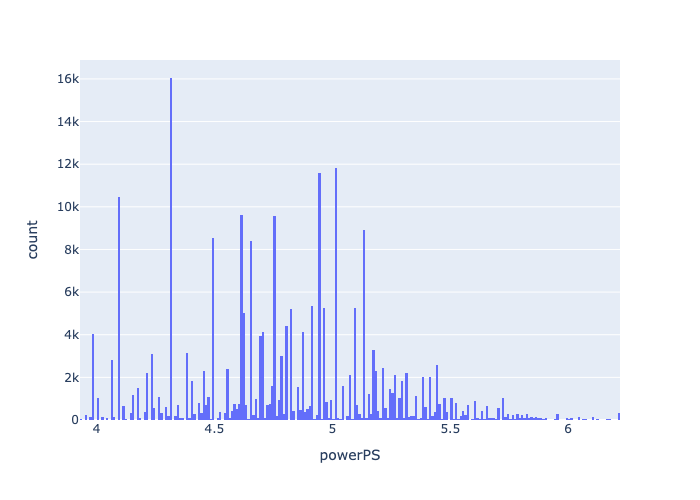

In [13]:
px.histogram(data, 'powerPS').show(renderer='png')

In [14]:
px.histogram(data, 'kilometer') # клипуем

In [15]:
data['kilometer'] = data['kilometer'].clip(50, 200_000)

In [16]:
px.histogram(data, 'autoAgeMonths') # клипуем

In [17]:
data['autoAgeMonths'] = data['autoAgeMonths'].clip(1, 600)

In [18]:
from sklearn.model_selection import train_test_split

data_train, data_test_val = train_test_split(data, test_size=0.2, random_state=42)

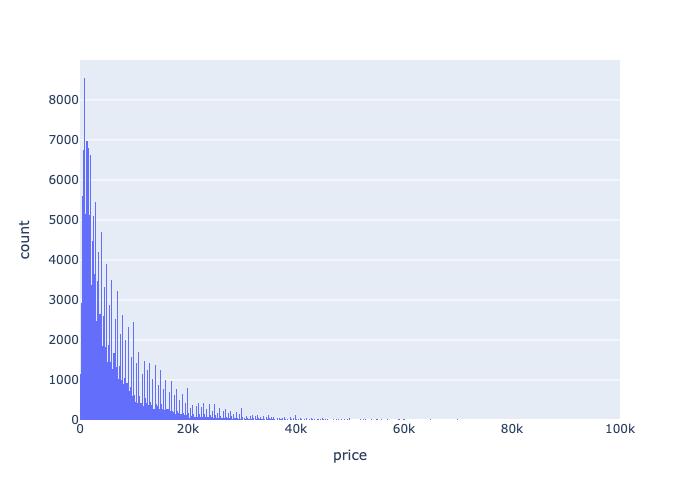

In [19]:
# теперь можно обработать и таргет трейна 

px.histogram(data_train, 'price').show(renderer='png') # нужно логарифмировать

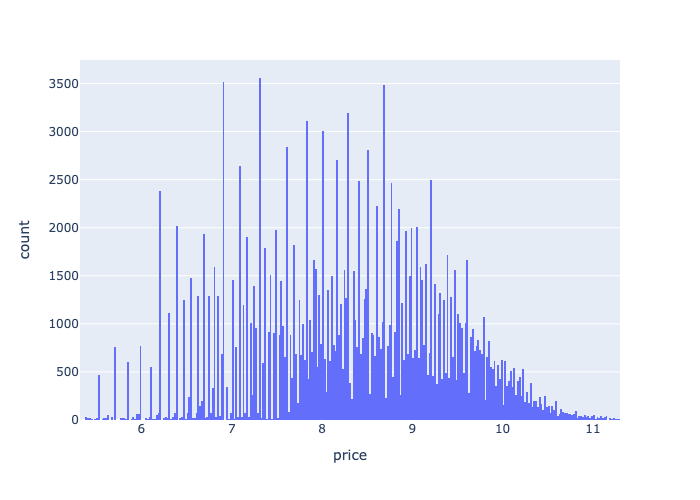

In [20]:
# убираем выбросы и просто экстримальные значения чтобы улучшить обучение
fter = (data_train['price'] > 200) & (data_train['price'] < 80_000)
# fter2 = (data_test_val['price'] > 200) & (data_test_val['price'] < 80_000)


data_train = data_train[fter] 
# data_test_val = data_test_val[fter2] 

data_train['price'] = np.log(data_train['price'])
data_test_val['price'] = np.log(data_test_val['price'])

px.histogram(data_train, 'price').show(renderer='png')

In [21]:
data_train['bias'] = 1
other += ['bias']

X_train = data_train[categorical + numeric + other]
y_train = data_train['price']


data_test_val['bias'] = 1

X_test_val = data_test_val[categorical + numeric + other]
y_test_val = data_test_val['price']

In [22]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler


# мы не фитим на трейне StandardScaler

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical),
    ('scaling', StandardScaler(), numeric),
    ('other',  'passthrough', other)
])

column_transformer = column_transformer.fit(X_train)

X_train = column_transformer.transform(X_train)
X_test_val = column_transformer.transform(X_test_val)

y_train = y_train.to_numpy()
y_test_val = y_test_val.to_numpy()

In [23]:
X_test, X_val, y_test, y_val = train_test_split(X_test_val, y_test_val, test_size=0.5, random_state=42)

## Задание 5. Сравнение методов градиентного спуска (2 балла)

В этом задании вам предстоит сравнить методы градиентного спуска на подготовленных вами данных из предыдущего задания.

### Задание 5.1. Подбор оптимальной длины шага (1 балл)

Подберите по валидационной выборке наилучшую длину шага $\lambda$ для каждого метода с точки зрения ошибки. Для этого сделайте перебор по логарифмической сетке. Для каждого метода посчитайте ошибку на обучающей и тестовой выборках, посчитайте качество по метрике $R^2$, сохраните количество итераций до сходимости.

Все параметры кроме `lambda_` стоит выставить равным значениям по умолчанию.

In [24]:
def fit_calc_loss(descent_config):
    regression = LinearRegression(
        descent_config=descent_config,
    )

    regression.fit(X_train, y_train)
    val_mse = regression.calc_loss(X_val, y_val)
    
    return regression, val_mse

In [25]:
from tqdm.notebook import tqdm
from sklearn.metrics import r2_score
from concurrent.futures import ThreadPoolExecutor, as_completed

lambdas = np.logspace(-0.1, -4, num=100)

def optimizer(descent_name):
    
    best_val_mse = float('inf')
    
    for lambda_ in tqdm(lambdas):

        descent_config = {
            'descent_name': descent_name,
            'kwargs': {
                'dimension': X_train.shape[1],
                'lambda_': lambda_
            }
        }

        regression, val_mse = fit_calc_loss(descent_config)
        
        if val_mse < best_val_mse:
            best_val_mse = val_mse
            train_mse = regression.calc_loss(X_train, y_train)
            
            # мы тест все равно больше нигде не используем так что будем дальше
            # сравнивать по нему наши результаты, тем более что нас просят так делать 
            
            test_mse = regression.calc_loss(X_test, y_test)        
            r2 = r2_score(y_test, regression.predict(X_test))
            
            best_lambda = lambda_
            
    return train_mse, best_val_mse, test_mse, r2, best_lambda, descent_name

results = []

with ThreadPoolExecutor(max_workers=4) as executor:
    futures = [executor.submit(optimizer, method) for method in ['full', 'stochastic', 'momentum', 'adam']]

    for future in as_completed(futures):
        results.append(future.result())
        
    executor.shutdown(wait=False)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

In [26]:
results = pd.DataFrame(results, columns=["train_mse", "val_mse", "test_mse", "test_r2", "lambda", "descent_name"])
results.set_index('descent_name', inplace=True)

results

,train_mse,val_mse,test_mse,test_r2,lambda
descent_name,,,,,
stochastic,0.327682,0.317084,0.339698,0.716897,0.552617
full,0.339815,0.328998,0.354560,0.704510,0.794328
momentum,0.264393,0.256504,0.276683,0.769413,0.794328
adam,0.246700,0.238863,0.257114,0.785722,0.794328


### Задание 5.2. Сравнение методов (1 балла) 

Постройте график зависимости ошибки на обучающей выборке от номера итерации (все методы на одном графике).

Посмотрите на получившиеся результаты (таблички с метриками и график). Сравните методы между собой.

In [27]:
import plotly.graph_objects as go

fig = go.Figure()

for i, descent_name in enumerate(['full', 'stochastic', 'momentum', 'adam']):

    descent_config = {
        'descent_name': descent_name,
        'kwargs': {
            'dimension': X_train.shape[1],
            'lambda_': results.loc[descent_name]["lambda"]
        }
    }

    regression = LinearRegression(
        descent_config=descent_config
    )

    regression.fit(X_train, y_train)
    
    losses = regression.loss_history
    
    fig.add_trace(
        go.Scatter(
            x=list(range(len(losses))),
            y=losses,
            mode='lines',
            name=f'{descent_name} MSE'
        )
    )

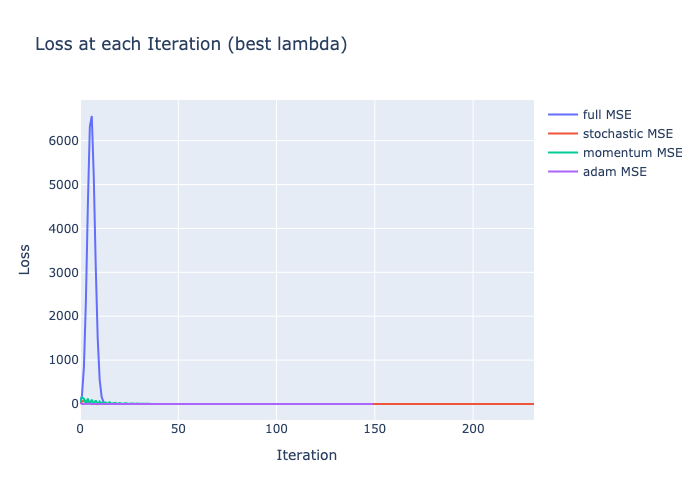

In [28]:
fig.update_layout(
    title="Loss at each Iteration (best lambda)",
    xaxis_title="Iteration",
    yaxis_title="Loss"
)

fig.show(renderer='png')

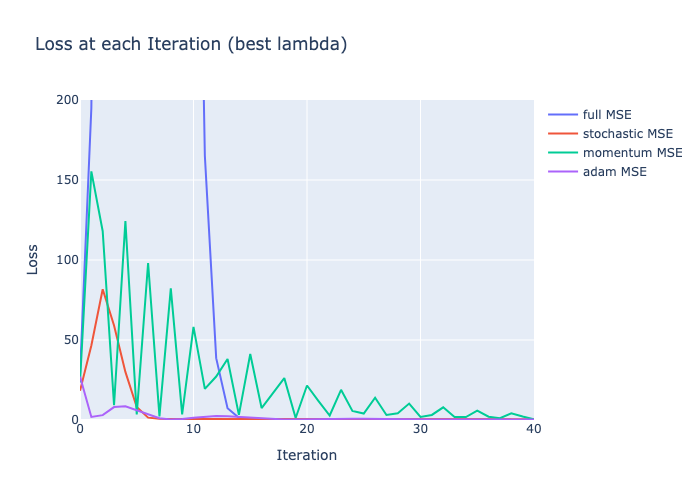

In [29]:
fig.update_layout(
    title="Loss at each Iteration (best lambda)",
    xaxis_title="Iteration",
    yaxis_title="Loss",
    xaxis_range=[0, 40],
    yaxis_range=[0, 200]
)

fig.show(renderer='png')

Adam хорошо сходится и имеет наилучшее качество, но блин очень долго по времени. Полный и стахастический градиентные спуски из-за своей случайности в начеле раздувают MSE, и в целом не достигаяют очень хорошего качества. Momentum имеет неплохое качество и сходимость.

## Задание 6. Стохастический градиентный спуск и размер батча (1 балл)

В этом задании вам предстоит исследовать влияние размера батча на работу стохастического градиентного спуска. 

* Сделайте по несколько запусков (например, k = 10) стохастического градиентного спуска на обучающей выборке для каждого размера батча из перебираемого списка. Замерьте время в секундах и количество итераций до сходимости. Посчитайте среднее этих значений для каждого размера батча.
* Постройте график зависимости количества шагов до сходимости от размера батча. _(под сходимостью понимается достижение критерия останова)_
* Постройте график зависимости времени до сходимости от размера батча.

Посмотрите на получившиеся результаты. Какие выводы можно сделать про подбор размера батча для стохастического градиентного спуска?

In [30]:
import time

batch_sizes = np.arange(5, 500, 10)

n_steps_mean = []
times = []
for k in tqdm(batch_sizes):
    
    n_steps = []
    start_time = time.time()

    for _ in range(10):
        
        descent_config = {
            'descent_name': "stochastic",
            'kwargs': {
                'dimension': X_train.shape[1],
                'lambda_': 0.55,
                "batch_size": k
            }
        }

        regression = LinearRegression(
            descent_config=descent_config
        )

        regression.fit(X_train, y_train)
        n_steps.append(len(regression.loss_history))
            
    end_time = time.time()
    
    times.append(end_time - start_time)
    n_steps_mean.append(np.mean(n_steps))    

  0%|          | 0/50 [00:00<?, ?it/s]

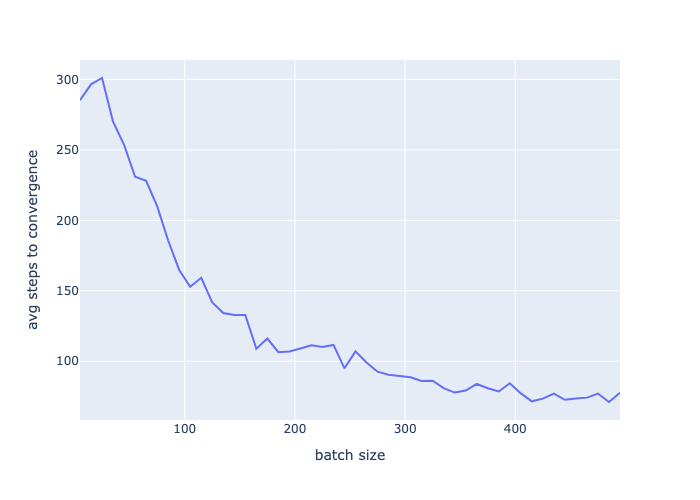

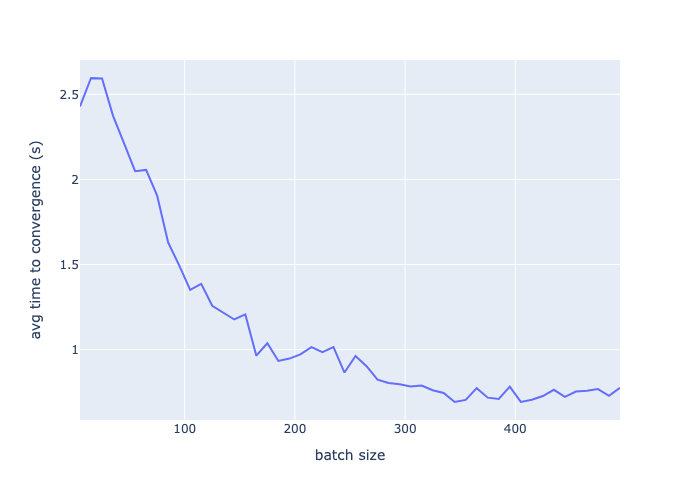

In [31]:
df = pd.DataFrame({
    'batch size': batch_sizes,
    'avg steps to convergence': n_steps_mean,
    'avg time to convergence (s)': times
})

fig = px.line(df, x='batch size', y='avg steps to convergence')
fig.show(renderer='png')

fig = px.line(df, x='batch size', y='avg time to convergence (s)')
fig.show(renderer='png')

Ну очев, чем больше батч тем быстрее мы сходимся (до какогото момента, а дальше асимптота), только понятно что там при совсем больших батчах на тесте метрика может быть хуже качество

## Задание 7. Регуляризация (1 балл)

В этом задании вам предстоит исследовать влияние регуляризации на работу различных методов градиентного спуска. Напомним, регуляризация - это добавка к функции потерь, которая штрафует за норму весов. Мы будем использовать l2 регуляризацию, таким образом функция потерь приобретает следующий вид:

$$
    Q(w) = \dfrac{1}{\ell} \sum\limits_{i=1}^{\ell} (a_w(x_i) - y_i)^2 + \dfrac{\mu}{2} \| w \|^2
$$

Допишите класс **BaseDescentReg** в файле `descents.py`.

Протестируйте ваше решение в контесте.

Вставьте ссылку на успешную посылку:

* **BaseDescentReg**:

Найдите лучшие параметры обучения с регуляризацией аналогично 5 заданию. Будем подбирать длину шага $\lambda$ (`lambda_`) и коэффициент регуляризации $\mu$ (`mu`).

Сравните для каждого метода результаты с регуляризацией и без регуляризации (нужно опять сохранить ошибку и качество по метрике $R^2$ на обучающей и тестовой выборках и количество итераций до сходимости).

Постройте для каждого метода график со значениями функции потерь MSE с регуляризацией и без регуляризации (всего должно получиться 4 графика).

Посмотрите на получившиеся результаты. Какие можно сделать выводы, как регуляризация влияет на сходимость? Как изменилось качество на обучающей выборке? На тестовой? Чем вы можете объяснить это?

In [32]:
from tqdm.notebook import tqdm
from sklearn.metrics import r2_score
from concurrent.futures import ThreadPoolExecutor, as_completed

lambdas = np.logspace(-0.1, -2, num=40)
mus = np.linspace(0, 0.01, num=20) # я смотрел большие значения и там точно меньше 0.01 значение должно быть

def optimizer(descent_name):
    
    best_val_mse = float('inf')
    
    for lambda_ in tqdm(lambdas):
        for mu in mus:

            descent_config = {
                'descent_name': descent_name,
                'regularized': True,
                'kwargs': {
                    'dimension': X_train.shape[1],
                    'lambda_': lambda_,
                    'mu': mu
                }
            }

            regression, val_mse = fit_calc_loss(descent_config)

            if val_mse < best_val_mse:
                best_val_mse = val_mse
                train_mse = regression.calc_loss(X_train, y_train)

                # мы тест все равно больше нигде не используем так что будем дальше
                # сравнивать по нему наши результаты, тем более что нас просят так делать 

                test_mse = regression.calc_loss(X_test, y_test)        
                r2 = r2_score(y_test, regression.predict(X_test))

                best_lambda = lambda_
                best_mu = mu
            
    return train_mse, best_val_mse, test_mse, r2, best_lambda, best_mu, descent_name

results2 = []

with ThreadPoolExecutor(max_workers=4) as executor:
    futures = [executor.submit(optimizer, method) for method in ['full', 'stochastic', 'momentum', 'adam']]

    for future in as_completed(futures):
        results2.append(future.result())
        
    executor.shutdown(wait=False)

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

In [33]:
results2 = pd.DataFrame(results2, columns=["train_mse", "val_mse", "test_mse", "test_r2", "lambda", "mu", "descent_name"])
results2.set_index('descent_name', inplace=True)

results2

,train_mse,val_mse,test_mse,test_r2,lambda,mu
descent_name,,,,,,
stochastic,0.309948,0.299317,0.324675,0.729417,0.794328,0.005789
full,0.332942,0.325701,0.349265,0.708924,0.794328,0.010000
momentum,0.258829,0.250745,0.271455,0.773770,0.794328,0.002632
adam,0.247189,0.239457,0.258103,0.784898,0.710039,0.000000


In [34]:
results

,train_mse,val_mse,test_mse,test_r2,lambda
descent_name,,,,,
stochastic,0.327682,0.317084,0.339698,0.716897,0.552617
full,0.339815,0.328998,0.354560,0.704510,0.794328
momentum,0.264393,0.256504,0.276683,0.769413,0.794328
adam,0.246700,0.238863,0.257114,0.785722,0.794328


На обучающей выборке качество улучшилось (странно но ок), на тестовой и валидации улучшилось, что закономерно так как мы теперь меньше переобучаемся. При этом для адама различий практически нет, видимо он практически не переобучается

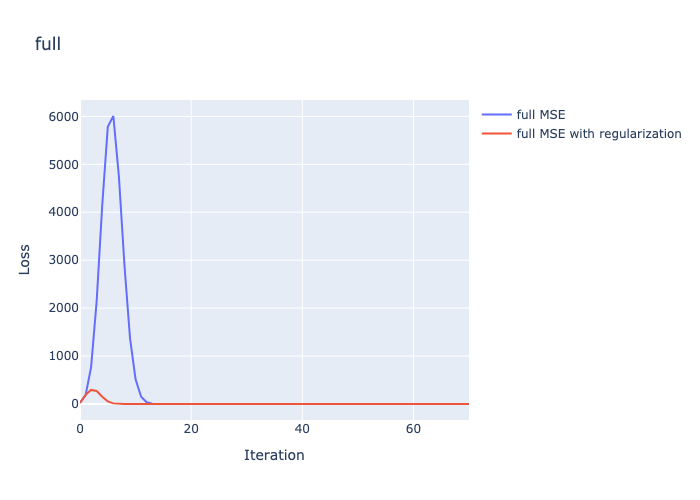

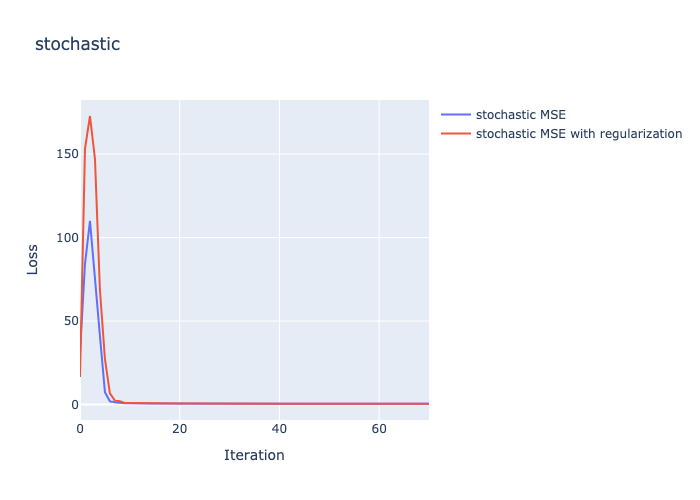

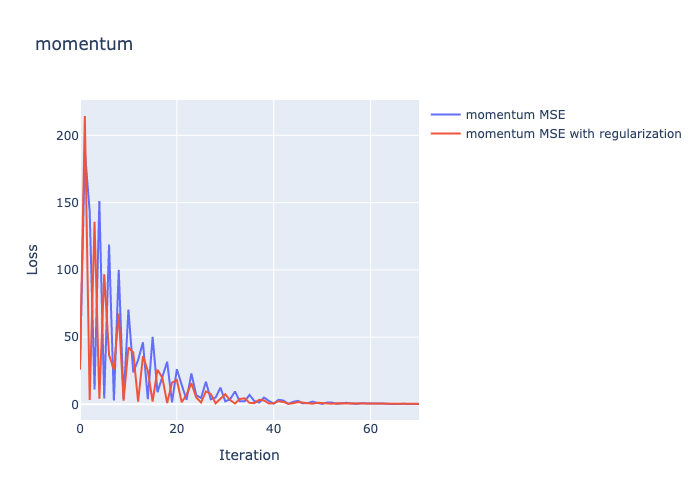

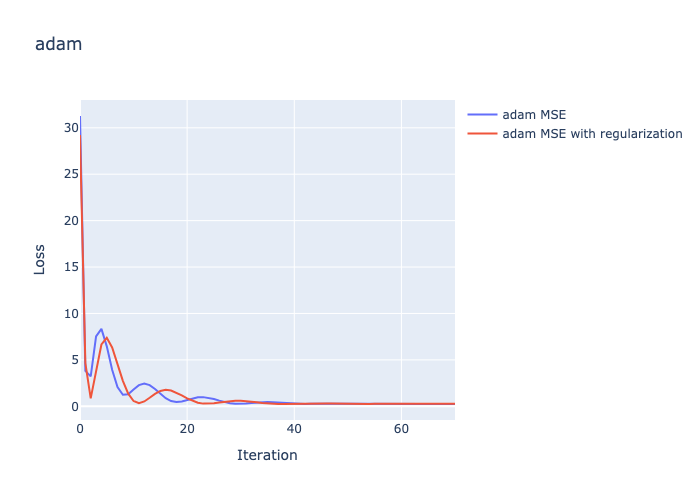

In [35]:
import plotly.graph_objects as go

for i, descent_name in enumerate(['full', 'stochastic', 'momentum', 'adam']):
    
    descent_config = {
        'descent_name': descent_name,
        'regularized': False,
        'kwargs': {
            'dimension': X_train.shape[1],
            "lambda_": results.loc[descent_name]["lambda"]
        }
    }

    regression = LinearRegression(
        descent_config=descent_config
    )

    regression.fit(X_train, y_train)
    
    losses = regression.loss_history
    
    fig = go.Figure()
    
    fig.add_trace(
        go.Scatter(
            x=list(range(len(losses))),
            y=losses,
            mode='lines',
            name=f'{descent_name} MSE'
        )
    )
    
    descent_config = {
        'descent_name': descent_name,
        'regularized': True,
        'kwargs': {
            'dimension': X_train.shape[1],
            "lambda_": results2.loc[descent_name]["lambda"],
            "mu": results2.loc[descent_name]["mu"]
        }
    }
        
    regression = LinearRegression(
        descent_config=descent_config
    )

    regression.fit(X_train, y_train)
    
    losses = regression.loss_history
        
    fig.add_trace(
        go.Scatter(
            x=list(range(len(losses))),
            y=losses,
            mode='lines',
            name=f'{descent_name} MSE with regularization'
        )
    )
    

    fig.update_layout(
        title=f"{descent_name}",
        xaxis_title="Iteration",
        yaxis_title="Loss",
        xaxis_range=[0, 70]
    )

    fig.show(renderer='png')

В полном и стахастическом спусках стал сильно стабильнее MSE в начале из-за того что регуляризация мешает хаотичности в начале сильно завысить веса. Моментум стал почему-то хуже работать с точки зрения сходимости.

## Задание 8. Альтернативная функция потерь (1 балл)

В этом задании вам предстоит использовать другую функцию потерь для нашей задачи регрессии. В качестве функции потерь мы выбрали **Log-Cosh**:

$$
    L(y, a)
    =
    \log\left(\cosh(a - y)\right).
$$

Самостоятельно продифференцируйте данную функцию потерь чтобы найти её градиент _(требуется показать не только результат, но и промежуточные вычисления)_:

$\frac{d L_1}{d w} = \frac{1}{\cosh(xW - y)} \frac{d \left[\cosh(xW - y)\right]}{d w} = \frac{\sinh(xW - y)}{\cosh(xW - y)} \frac{d\left[xW - y\right]}{d w} = \tanh(xW - y) X = |векторстрокииииии| = X^T \tanh(xW - y)$

Ну и там еще на размер X мы делим так как это формула для одного элемента была, итого

$\frac{d L}{d w} = \frac{1}{l}  X^T \tanh(xW - y)$

Программно реализуйте градиентный спуск с данной функцией потерь в файле `descents.py`, обучите все четыре метода (без регуляризации) аналогично 5 заданию, сравните их качество с четырьмя методами из 5 задания.

Пример того, как можно запрограммировать использование нескольких функций потерь внутри одного класса градиентного спуска:


```python
from enum import auto
from enum import Enum

import numpy as np

class LossFunction(Enum):
    MSE = auto()
    MAE = auto()
    LogCosh = auto()
    Huber = auto()

...
class BaseDescent:
    def __init__(self, loss_function: LossFunction = LossFunction.MSE):
        self.loss_function: LossFunction = loss_function

    def calc_gradient(self, x: np.ndarray, y: np.ndarray) -> np.ndarray:
        if self.loss_function is LossFunction.MSE:
            return ...
        elif self.loss_function is LossFunction.LogCosh:
            return ...
...

```

In [36]:
from descents import LossFunction

from tqdm.notebook import tqdm
from sklearn.metrics import r2_score
from concurrent.futures import ThreadPoolExecutor, as_completed

lambdas = np.logspace(-0.1, -4, num=100)

def optimizer(descent_name):
    
    best_val_mse = float('inf')
    
    for lambda_ in tqdm(lambdas):

        descent_config = {
            'descent_name': descent_name,
            'kwargs': {
                'dimension': X_train.shape[1],
                'lambda_': lambda_,
                'loss_function': LossFunction.LogCosh
            }
        }

        regression, val_mse = fit_calc_loss(descent_config)
        
        if val_mse < best_val_mse:
            best_val_mse = val_mse
            train_mse = regression.calc_loss(X_train, y_train)
            
            # мы тест все равно больше нигде не используем так что будем дальше
            # сравнивать по нему наши результаты, тем более что нас просят так делать 
            
            test_mse = regression.calc_loss(X_test, y_test)        
            r2 = r2_score(y_test, regression.predict(X_test))
            MSE = np.mean((y_test - regression.predict(X_test)) ** 2)
            
            best_lambda = lambda_
            
    return train_mse, best_val_mse, test_mse, MSE, r2, best_lambda, descent_name

results3 = []

with ThreadPoolExecutor(max_workers=4) as executor:
    futures = [executor.submit(optimizer, method) for method in ['full', 'stochastic', 'momentum', 'adam']]

    for future in as_completed(futures):
        results3.append(future.result())
        
    executor.shutdown(wait=False)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

In [37]:
results3 = pd.DataFrame(results3, columns=["train_log_cosh", "val_log_cosh", "test_log_cosh", "test_mse","test_r2", "lambda", "descent_name"])
results3.set_index('descent_name', inplace=True)

results3

,train_log_cosh,val_log_cosh,test_log_cosh,test_mse,test_r2,lambda
descent_name,,,,,,
stochastic,0.155405,0.154135,0.157904,0.402229,0.664783,0.794328
full,0.179042,0.176255,0.181605,0.467250,0.610595,0.794328
momentum,0.115185,0.112938,0.119070,0.314308,0.738056,0.725448
adam,0.097985,0.095770,0.101187,0.267323,0.777214,0.794328


In [38]:
results

,train_mse,val_mse,test_mse,test_r2,lambda
descent_name,,,,,
stochastic,0.327682,0.317084,0.339698,0.716897,0.552617
full,0.339815,0.328998,0.354560,0.704510,0.794328
momentum,0.264393,0.256504,0.276683,0.769413,0.794328
adam,0.246700,0.238863,0.257114,0.785722,0.794328


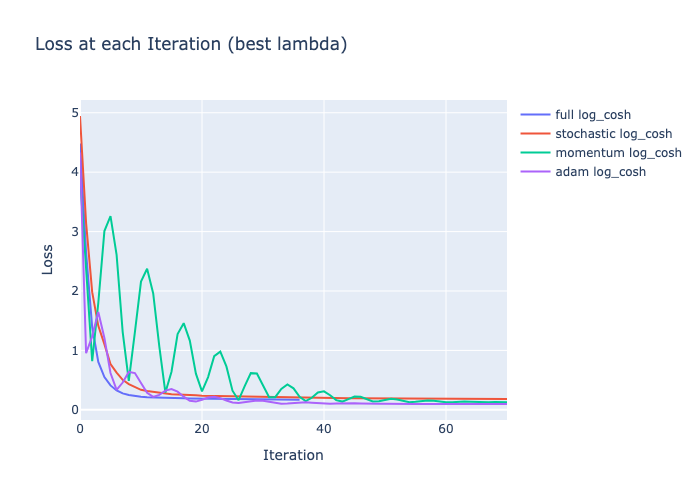

In [39]:
fig = go.Figure()

for i, descent_name in enumerate(['full', 'stochastic', 'momentum', 'adam']):    
    descent_config = {
        'descent_name': descent_name,
        'kwargs': {
            'dimension': X_train.shape[1],
            'lambda_': results3.loc[descent_name]["lambda"],
            'loss_function': LossFunction.LogCosh
        }
    }

    regression = LinearRegression(
        descent_config=descent_config
    )

    regression.fit(X_train, y_train)
    
    losses = regression.loss_history
    
    fig.add_trace(
        go.Scatter(
            x=list(range(len(losses))),
            y=losses,
            mode='lines',
            name=f'{descent_name} log_cosh'
        )
    )
    

fig.update_layout(
    title="Loss at each Iteration (best lambda)",
    xaxis_title="Iteration",
    yaxis_title="Loss",
    xaxis_range=[0, 70]
)

fig.show(renderer='png')

Cтало сильно стабильнее обучнение. Но при этом по метрикам все стало хуже (ну в целом понтно, r2 и mse заточены под mse). При этом для адама различия минимальные

### Кулинарно-социализационный бонус. (0.5 балла).

Как мы знаем, осень прекрасная пора, время пробовать новое и делиться теплом с друзьями и близкими. Выберите рецепт, который соответствует вашему настроению, приготовьте выбранное блюдо и угостите хотя бы одного человека им. Кратко опишите ваши впечатления, прикрепите рецепт и фотографии блюда и довольного гостя.

`### ваш кулинарный опыт тут ###`

### Бонус 1. Другие методы градиентного спуска (1 балл).

По желанию выберите метод градиентного спуска из следующего списка и самостоятельно реализуйте его в файле `descents.py`. Обучите линейную регрессию с помощью этого метода, сравните с методами из основной части домашнего задания.

`AdaMax` (вариация Adam основанная на $l_{\infty}$), `Nadam` (вариация Adam совмещенная с методом импульса Нестерова), `AMSGrad` (ещё одна вариация Adam).

`AdaMax`, я выбираю тебя

In [40]:
from descents import LossFunction

from tqdm.notebook import tqdm
from sklearn.metrics import r2_score
from concurrent.futures import ThreadPoolExecutor, as_completed

lambdas = np.logspace(-0.1, -4, num=100)

def optimizer(descent_name):
    
    best_val_mse = float('inf')
    
    for lambda_ in tqdm(lambdas):

        descent_config = {
            'descent_name': descent_name,
            'kwargs': {
                'dimension': X_train.shape[1],
                'lambda_': lambda_
            }
        }

        regression, val_mse = fit_calc_loss(descent_config)
        
        if val_mse < best_val_mse:
            best_val_mse = val_mse
            train_mse = regression.calc_loss(X_train, y_train)
            
            # мы тест все равно больше нигде не используем так что будем дальше
            # сравнивать по нему наши результаты, тем более что нас просят так делать 
            
            test_mse = regression.calc_loss(X_test, y_test)        
            r2 = r2_score(y_test, regression.predict(X_test))
            
            best_lambda = lambda_
            
    return train_mse, best_val_mse, test_mse, r2, best_lambda, descent_name

results4 = []

# with ThreadPoolExecutor(max_workers=4) as executor:
#     futures = [executor.submit(optimizer, method) for method in ['adamax']]

#     for future in as_completed(futures):
#         results4.append(future.result())
        
#     executor.shutdown(wait=False)

results4 = [optimizer('adamax')]

  0%|          | 0/100 [00:00<?, ?it/s]

In [41]:
results4 = pd.DataFrame(results4, columns=["train_mse", "val_mse", "test_mse", "test_r2", "lambda", "descent_name"])
results4.set_index('descent_name', inplace=True)

results4

,train_mse,val_mse,test_mse,test_r2,lambda
descent_name,,,,,
adamax,0.254642,0.247022,0.264631,0.779457,0.794328


In [42]:
results

,train_mse,val_mse,test_mse,test_r2,lambda
descent_name,,,,,
stochastic,0.327682,0.317084,0.339698,0.716897,0.552617
full,0.339815,0.328998,0.354560,0.704510,0.794328
momentum,0.264393,0.256504,0.276683,0.769413,0.794328
adam,0.246700,0.238863,0.257114,0.785722,0.794328


In [43]:
results2

,train_mse,val_mse,test_mse,test_r2,lambda,mu
descent_name,,,,,,
stochastic,0.309948,0.299317,0.324675,0.729417,0.794328,0.005789
full,0.332942,0.325701,0.349265,0.708924,0.794328,0.010000
momentum,0.258829,0.250745,0.271455,0.773770,0.794328,0.002632
adam,0.247189,0.239457,0.258103,0.784898,0.710039,0.000000


Мы немного хуже адама, но лучше других, неплохо

### Бонус 2. Другие функции потерь (1 балл).

Аналогично 8 заданию реализуйте две функции потерь - **MAE** и **Huber**.

Самостоятельно продифференцируйте данные функции потерь, чтобы найти их градиенты _(требуется показать не только результат, но и промежуточные вычисления)_:

`### ваше решение тут ###`

Программно реализуйте градиентный спуск с данными функциями потерь в файле `descents.py`, обучите все четыре метода (без регуляризации) аналогично 5 заданию, сравните их качество с четырьмя методами из 5 задания.

Сравните между собой *для каждого метода отдельно* качество для разных функций потерь. Какая оказалась лучше? Как вы думаете почему?

In [44]:
# YOUR CODE: